In [1]:
# dependancies
import math
import random
import pygame
import sys
import json
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch_geometric.nn import GCNConv
from torch_geometric.utils import dense_to_sparse
import matplotlib.pyplot as plt
import os
import pandas as pd
from torch.utils.data import Dataset, DataLoader
from torch_geometric.data import Data, InMemoryDataset, download_url, TemporalData

pygame 2.6.0 (SDL 2.28.4, Python 3.11.9)
Hello from the pygame community. https://www.pygame.org/contribute.html


In [2]:
import math
import random
import pygame
import sys
import numpy as np
import json
import os
import pandas as pd
# Simulating Boids Algorithm

#Includes code on Boids Algorithm and saving that information over time.
# Size of canvas. These get updated to fill the whole screen.
width = 1000
height = 1000

numBoids = 100
visualRange = 75

boids = []
 
def initBoids():
    global boids
    boids = []
    for i in range(numBoids):
        boids.append({
            'x': random.random() * width,
            'y': random.random() * height,
            'dx': random.random() * 10 - 5,
            'dy': random.random() * 10 - 5,
            'history': [],
            # 'all_history': []
        })

    df = pd.DataFrame(boids) # Create a DataFrame For Boids
    df.drop(labels='history', axis=1, inplace=True) # Drop the history column
    df['Boids'] = [i for i in range(len(boids))] # Add column 'Boids' for boid number
    return df
def distance(boid1, boid2):
    return math.sqrt((boid1['x'] - boid2['x'])**2 + (boid1['y'] - boid2['y'])**2)

def nClosestBoids(boid, n):
    sorted_boids = sorted(boids, key=lambda other_boid: distance(boid, other_boid))
    return sorted_boids[1:n+1]

def sizeCanvas():
    global width, height
    size = (width, height)
    return pygame.display.set_mode(size)

def keepWithinBounds(boid):
    margin = 200
    turnFactor = 1

    if boid['x'] < margin:
        boid['dx'] += turnFactor
    if boid['x'] > width - margin:
        boid['dx'] -= turnFactor
    if boid['y'] < margin:
        boid['dy'] += turnFactor
    if boid['y'] > height - margin:
        boid['dy'] -= turnFactor

def flyTowardsCenter(boid):
    centeringFactor = 0.005

    centerX = 0
    centerY = 0
    numNeighbors = 0

    for otherBoid in boids:
        if distance(boid, otherBoid) < visualRange:
            centerX += otherBoid['x']
            centerY += otherBoid['y']
            numNeighbors += 1

    if numNeighbors:
        centerX /= numNeighbors
        centerY /= numNeighbors

        boid['dx'] += (centerX - boid['x']) * centeringFactor
        boid['dy'] += (centerY - boid['y']) * centeringFactor

def avoidOthers(boid):
    minDistance = 20
    avoidFactor = 0.05
    moveX = 0
    moveY = 0

    for otherBoid in boids:
        if otherBoid != boid:
            if distance(boid, otherBoid) < minDistance:
                moveX += boid['x'] - otherBoid['x']
                moveY += boid['y'] - otherBoid['y']

    boid['dx'] += moveX * avoidFactor
    boid['dy'] += moveY * avoidFactor

def matchVelocity(boid):
    matchingFactor = 0.05

    avgDX = 0
    avgDY = 0
    numNeighbors = 0

    for otherBoid in boids:
        if distance(boid, otherBoid) < visualRange:
            avgDX += otherBoid['dx']
            avgDY += otherBoid['dy']
            numNeighbors += 1

    if numNeighbors:
        avgDX /= numNeighbors
        avgDY /= numNeighbors

        boid['dx'] += (avgDX - boid['dx']) * matchingFactor
        boid['dy'] += (avgDY - boid['dy']) * matchingFactor

def limitSpeed(boid):
    speedLimit = 10

    speed = math.sqrt(boid['dx']**2 + boid['dy']**2)
    if speed > speedLimit:
        boid['dx'] = (boid['dx'] / speed) * speedLimit
        boid['dy'] = (boid['dy'] / speed) * speedLimit

def drawBoid(screen, boid):
    angle = math.atan2(boid['dy'], boid['dx'])
    boid_surface = pygame.Surface((30, 10), pygame.SRCALPHA)
    pygame.draw.polygon(boid_surface, (85, 140, 244), [
        (0, 0), (0, 10), (-15, 5)
    ])
    rotated_boid = pygame.transform.rotate(boid_surface, math.degrees(angle))
    rotated_rect = rotated_boid.get_rect(center=(boid['x'], boid['y']))
    screen.blit(rotated_boid, rotated_rect)

    if DRAW_TRAIL:
        for point in boid['history']:
            pygame.draw.circle(screen, (85, 140, 244, 102), (int(point[0]), int(point[1])), 1)

# Main animation loop
def animationLoop(animate=False):
    global boids
    for boid in boids:
        flyTowardsCenter(boid)
        avoidOthers(boid)
        matchVelocity(boid)
        limitSpeed(boid)
        keepWithinBounds(boid)

        boid['x'] += boid['dx']
        boid['y'] += boid['dy']
        boid['history'].append((boid['x'], boid['y']))
        boid['history'] = boid['history'][-50:]

    if animate:
        screen.fill((255, 255, 255))
        for boid in boids:
            drawBoid(screen, boid)

        pygame.display.flip()
        pygame.time.Clock().tick(60)

    df = pd.DataFrame(boids)
    df.drop(labels='history', axis=1, inplace=True)
    df['Boids'] = [i for i in range(len(boids))]
    
    return df

pygame.init()
screen = sizeCanvas()
DRAW_TRAIL = False

# initBoids()
# while True:
#     for event in pygame.event.get():
#         if event.type == pygame.QUIT:
#             pygame.quit()
#             sys.exit()
#     animationLoop()
## Running Boids Algorithm and Saving Information Into Pandas DataFrame
directory = '../data/myjson'
if not os.path.exists(directory):
    os.makedirs(directory)
import pandas as pd

num_sims = 10
num_time_steps = 1000

# Initialize final_df as an empty DataFrame
final_df = pd.DataFrame()

for n in range(num_sims):  # Run simulation num_sims times
    curr_df_list = []  # List to store DataFrames for current simulation
    curr_df = initBoids()  # Initialize boids with different positions and velocities
    curr_df['Simulation'] = [n] * len(curr_df)  # Set Simulation number
    curr_df['Timestep'] = [0] * len(curr_df)  # Set Timestep number to 0
    curr_df_list.append(curr_df)  # Append initial state to list

    for t in range(1, num_time_steps):  # Run animationLoop() for num_time_steps
        new_df = animationLoop()  # Updates boids to have new positions and velocities
        new_df['Simulation'] = [n] * len(new_df)  # Set Simulation number
        new_df['Timestep'] = [t] * len(new_df)  # Set Timestep number
        curr_df_list.append(new_df)  # Append updated state to list

    # Concatenate all DataFrames in the list once per simulation
    curr_df = pd.concat(curr_df_list, ignore_index=True)
    # Append the result of the current simulation to final_df
    final_df = pd.concat([final_df, curr_df], ignore_index=True)
final_df.reset_index()
final_df
## Converting Simulation DataFrame to CSV
path_to_save = '../data/simulation.csv'
final_df.to_csv(path_to_save, index=False)
## Save Edges From Each Timestep/Simulation
path_to_save = '../data/simulation.csv'
final_df = pd.read_csv(path_to_save)
### Compute The Edges Per Timestep Per Simulation
from scipy.spatial.distance import pdist, squareform
# Distance threshold

# Function to calculate pairwise distances and return edges
def get_edges(df, threshold):
    
    distances = squareform(pdist(df[['x', 'y']])) # Calculate pairwise distances
    
    close_pairs = distances < threshold # Identify pairs within the threshold distance
    
    # Extract indices of close pairs
    edges = [(i, j) for i in range(len(distances)) for j in range(i+1, len(distances)) if close_pairs[i, j]]
    
    # Create DataFrame for edges
    edges_df = pd.DataFrame(edges, columns=['Boid_i', 'Boid_j'])
    
    return edges_df


edges_dfs = []  # List to collect DataFrames
final_df_groupby = final_df.groupby(['Timestep', 'Simulation'])
for key, item in final_df_groupby:
    edges_df = get_edges(item, visualRange)  # Pass the group directly
    edges_df['Timestep'] = key[0]
    edges_df['Simulation'] = key[1]
    edges_dfs.append(edges_df)

# Concatenate all DataFrames at once, if edges_dfs is not empty
if edges_dfs:
    final_edges_df = pd.concat(edges_dfs, ignore_index=True)
    final_edges_df.reset_index(drop=True, inplace=True)  # Reset index once, outside the loop
else:
    final_edges_df = pd.DataFrame()  # Initialize to an empty DataFrame if no edges were found

final_edges_df
### Save final_edges_df As A CSV
path_to_save = '../data/simulation_edges.csv'
final_edges_df.to_csv(path_to_save, index=False)
final_edges_df
final_df

pygame 2.6.0 (SDL 2.28.4, Python 3.11.9)
Hello from the pygame community. https://www.pygame.org/contribute.html


,x,y,dx,dy,Boids,Simulation,Timestep
0,530.348799,966.386645,1.147657,-0.538506,0,0,0
1,356.934224,655.312298,4.211523,-1.076008,1,0,0
2,632.196378,223.052455,-2.724301,2.526807,2,0,0
3,979.063315,913.383738,4.894598,0.948978,3,0,0
4,383.215781,708.025047,1.228946,2.996559,4,0,0
...,...,...,...,...,...,...,...
999995,644.256306,684.266354,3.603143,-0.369277,95,9,999
999996,828.887488,622.787588,-4.381960,-1.742435,96,9,999
999997,759.190617,342.578785,-0.172966,-6.905667,97,9,999
999998,617.602799,713.370698,2.327580,3.923501,98,9,999


In [92]:
final_edges_df

,Boid_i,Boid_j,Timestep,Simulation
0,2,70,0,0
1,2,90,0,0
2,3,26,0,0
3,3,44,0,0
4,3,48,0,0
...,...,...,...,...
7898811,94,95,999,9
7898812,95,97,999,9
7898813,96,98,999,9
7898814,96,99,999,9


In [12]:
# process data
import pandas as pd
import numpy as np
import torch
from torch_geometric.data import Data, Dataset
from torch.utils.data import Dataset as TorchDataset

path_to_sim = '../data/simulation.csv'
sim_df = pd.read_csv(path_to_sim)
path_to_sim_edges = '../data/simulation_edges.csv'
sim_edges_df = pd.read_csv(path_to_sim_edges)



def toDataGraph(sim_df, sim_edges_df, node_features_names):
    """
    Converts simulation data into a PyTorch Geometric Data object.

    Parameters:
    - sim_df (DataFrame): DataFrame containing node features for a specific simulation and timestep.
    - sim_edges_df (DataFrame): DataFrame containing edge information for the simulation.
    - node_features_names (list of str): Names of the columns in sim_df that are node features.

    Returns:
    - Data: A PyTorch Geometric Data object representing the graph for the simulation.
    """
    # Convert node features and edge information into tensors
    node_features = torch.tensor(sim_df[node_features_names].to_numpy(), dtype=torch.float)
    edge_index = torch.tensor(sim_edges_df[['Boid_i', 'Boid_j']].to_numpy().T, dtype=torch.long)
    # edge_attributes = torch.tensor(np.ones((sim_edges_df.shape[0], 1)), dtype=torch.float)

    # Create and return the Data object
    graph = Data(x=node_features, edge_index=edge_index) #, edge_attr=edge_attributes)
    return graph

def allDataGraph(sim_df, sim_edges_df):
    """
    Generates a list of PyTorch Geometric Data objects for each simulation and timestep.

    Parameters:
    - sim_df (DataFrame): DataFrame containing node features for all simulations and timesteps.
    - sim_edges_df (DataFrame): DataFrame containing edge information for all simulations and timesteps.

    Returns:
    - list of Data: A list of PyTorch Geometric Data objects, one for each simulation and timestep.
    """
    # Group the data by simulation and timestep
    sim_gb_df = sim_df.groupby(['Timestep', 'Simulation'])
    sim_edges_gb_df = sim_edges_df.groupby(['Timestep', 'Simulation'])

    graphs = []
    # Iterate over each group and convert to a Data object
    for key in sim_gb_df.groups.keys():
        curr_sim_df = sim_gb_df.get_group(key)
        curr_sim_edges_df = sim_edges_gb_df.get_group(key)
        curr_graph = toDataGraph(curr_sim_df, curr_sim_edges_df, ['x', 'y', 'dx', 'dy'])
        graphs.append(curr_graph)

    return graphs

def create_sequences(graphs, seq_len):
    """
    Creates sequences of graphs for the dataset.

    Parameters:
    - graphs (list of Data): List of PyTorch Geometric Data objects representing graphs over time.
    - seq_len (int): Length of the sequences to create.

    Returns:
    - sequences (list of list of Data): List of sequences, where each sequence is a list of Data objects.
    - labels (list of Data): List of labels (i.e., the last graph in each sequence).
    """
    sequences = [graphs[i-seq_len:i] for i in range(seq_len, len(graphs))]
    labels = [graphs[i] for i in range(seq_len, len(graphs))]
    return sequences, labels

class CustomDataset(TorchDataset):
    def __init__(self, sim_df, sim_edges_df, seq_len):
        super(CustomDataset, self).__init__()
        self.all_graphs = allDataGraph(sim_df, sim_edges_df)
        self.sequences, self.labels = create_sequences(self.all_graphs, seq_len)
        self.len = len(self.labels)
        
    def __getitem__(self, index):
        return self.sequences[index], self.labels[index]
    
    def __len__(self):
        return self.len

# Define sequence length
seq_len = 4

# Initialize dataset
dataset = CustomDataset(sim_df, sim_edges_df, seq_len)


In [5]:
dataset[1]

([Data(x=[100, 4], edge_index=[2, 89]),
  Data(x=[100, 4], edge_index=[2, 73]),
  Data(x=[100, 4], edge_index=[2, 78]),
  Data(x=[100, 4], edge_index=[2, 108])],
 Data(x=[100, 4], edge_index=[2, 72]))

In [6]:
import torch
from torch_geometric.data import Data
from torch.utils.data import Dataset as TorchDataset
import numpy as np

def generate_random_graph(num_nodes, num_features, min_edges, max_edges):
    # Create random node features
    x = torch.tensor(np.random.rand(num_nodes, num_features), dtype=torch.float)

    # Randomly determine the number of edges
    num_edges = np.random.randint(min_edges, max_edges + 1)
    
    # Generate random edges
    edges = np.random.randint(0, num_nodes, size=(2, num_edges * 2))  # Generate twice as many edges initially

    # Remove self-loops
    mask = edges[0] != edges[1]
    edges = edges[:, mask]

    # Remove duplicate edges by converting to a set
    edges = np.unique(edges, axis=1)
    
    # Ensure the number of edges is as required
    if edges.shape[1] > num_edges:
        edges = edges[:, :num_edges]
    elif edges.shape[1] < num_edges:
        # If not enough edges, add random additional edges
        additional_edges = np.random.randint(0, num_nodes, size=(2, num_edges - edges.shape[1]))
        edges = np.hstack([edges, additional_edges])

    # Create PyTorch Geometric Data object
    edge_index = torch.tensor(edges, dtype=torch.long)
    data = Data(x=x, edge_index=edge_index)
    
    return data

def generate_graph_sequence(num_graphs, num_nodes, num_features, min_edges, max_edges):
    # Generate the list of Data objects
    graph_list = [generate_random_graph(num_nodes, num_features, min_edges, max_edges) for _ in range(num_graphs)]
    
    # Generate the final single Data object
    final_graph = generate_random_graph(num_nodes, num_features, min_edges, max_edges)
    
    return graph_list, final_graph

def create_sequences(graphs, seq_len):
    """
    Creates sequences of graphs for the dataset.
    """
    sequences = [graphs[i-seq_len:i] for i in range(seq_len, len(graphs))]
    labels = [graphs[i] for i in range(seq_len, len(graphs))]
    return sequences, labels

class CustomDataset1(TorchDataset):
    def __init__(self, graphs, seq_len):
        super(CustomDataset1, self).__init__()
        self.sequences, self.labels = create_sequences(graphs, seq_len)
        self.len = len(self.labels)
        
    def __getitem__(self, index):
        return self.sequences[index], self.labels[index]
    
    def __len__(self):
        return self.len

# Parameters for random graph generation
num_nodes = 100
num_features = 4
min_edges = 50  # Minimum number of edges
max_edges = 100  # Maximum number of edges
num_graphs = 10  # Number of graphs to generate
seq_len = 4  # Sequence length for dataset

# Generate random graphs
graph_list, final_graph = generate_graph_sequence(num_graphs, num_nodes, num_features, min_edges, max_edges)

# Create dataset with the generated graphs
dataset_rand = CustomDataset1(graph_list, seq_len)

# Print information about the dataset
for i in range(len(dataset)):
    sequences, labels = dataset[i]
    print(f"Sequence {i+1}:")
    for j, graph in enumerate(sequences):
        print(f"  Graph {j+1}:")
        print(f"    Number of Nodes: {graph.num_nodes}")
        print(f"    Number of Edges: {graph.num_edges}")
        print(f"    Node Features: {graph.x.shape}")
        print(f"    Edge Index: {graph.edge_index.shape}\n")
    print("  Label (final graph):")
    print(f"    Number of Nodes: {labels.num_nodes}")
    print(f"    Number of Edges: {labels.num_edges}")
    print(f"    Node Features: {labels.x.shape}")
    print(f"    Edge Index: {labels.edge_index.shape}\n")


Sequence 1:
  Graph 1:
    Number of Nodes: 100
    Number of Edges: 84
    Node Features: torch.Size([100, 4])
    Edge Index: torch.Size([2, 84])

  Graph 2:
    Number of Nodes: 100
    Number of Edges: 89
    Node Features: torch.Size([100, 4])
    Edge Index: torch.Size([2, 89])

  Graph 3:
    Number of Nodes: 100
    Number of Edges: 73
    Node Features: torch.Size([100, 4])
    Edge Index: torch.Size([2, 73])

  Graph 4:
    Number of Nodes: 100
    Number of Edges: 78
    Node Features: torch.Size([100, 4])
    Edge Index: torch.Size([2, 78])

  Label (final graph):
    Number of Nodes: 100
    Number of Edges: 108
    Node Features: torch.Size([100, 4])
    Edge Index: torch.Size([2, 108])

Sequence 2:
  Graph 1:
    Number of Nodes: 100
    Number of Edges: 89
    Node Features: torch.Size([100, 4])
    Edge Index: torch.Size([2, 89])

  Graph 2:
    Number of Nodes: 100
    Number of Edges: 73
    Node Features: torch.Size([100, 4])
    Edge Index: torch.Size([2, 73])

  G

In [96]:


# Define Discriminator
class Discriminator(nn.Module):
    def __init__(self, input_dim, hidden_dim):
        super(Discriminator, self).__init__()
        self.net = nn.Sequential(
            nn.Linear(input_dim, hidden_dim),
            nn.LeakyReLU(),
            nn.Linear(hidden_dim, 1),
            nn.Sigmoid()
        )
    
    def forward(self, x):
        return self.net(x)

# Initialize the discriminator
discriminator = Discriminator(input_dim=4, hidden_dim=32)

In [97]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch_geometric.nn import GCNConv

class GRNN(nn.Module):
    def __init__(self, node_feature_dim, hidden_dim, gru_hidden_dim, output_dim, num_nodes, seq_len):
        super(GRNN, self).__init__()
        self.conv1 = GCNConv(node_feature_dim, hidden_dim)
        self.conv2 = GCNConv(hidden_dim, hidden_dim)
        self.gru = nn.GRU(hidden_dim, gru_hidden_dim, batch_first=True)
        
        self.feature_decoder = nn.Sequential(
            nn.Linear(gru_hidden_dim, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, output_dim)
        )
        
        self.adj_decoder = nn.Sequential(
            nn.Linear(gru_hidden_dim, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, num_nodes * num_nodes),
            # nn.Sigmoid()
        )
        
        self.seq_len = seq_len
        self.num_nodes = num_nodes
    
    def forward(self, seq):
        # seq: list of Data Objects from Pytorch Geometric
        # x: [batch_size, seq_len, num_nodes, node_feature_dim]
        # adj: [batch_size, seq_len, num_nodes, num_nodes]
        
        seq_len = len(seq)
        
        
        # Prepare lists to hold GCN outputs
        gcn_outputs = []
        
        for t in range(seq_len):
            graph_t = seq[t]
            edge_index_t = graph_t.edge_index
            # edge_index = self.adjacency_matrix_to_edge_index(adj[:, t])
            
            # Apply GCN layers
            # x_t = x[:, t]  # [batch_size, num_nodes, node_feature_dim]
            x_t = F.relu(self.conv1(graph_t.x, edge_index_t))
            x_t = F.relu(self.conv2(x_t, edge_index_t))
            
            gcn_outputs.append(x_t.unsqueeze(1))  # Append time step output
        
        # Stack the outputs to form a sequence
        gcn_outputs = torch.cat(gcn_outputs, dim=1)  
        
        # Apply GRU
        x, _ = self.gru(gcn_outputs)
        
        # Use only the last time step output for decoding
        x = x[:, -1, :]  # [batch_size, gru_hidden_dim]
        
        # Apply decoders
        feature_output = self.feature_decoder(x)
        adj_output = self.adj_decoder(x)
        
        # # Reshape adjacency matrix output
        # adj_output = adj_output.view(-1, self.num_nodes, self.num_nodes)
        
        return feature_output, adj_output

    # def adjacency_matrix_to_edge_index(self, adj):
    #     edge_index = torch.nonzero(adj, as_tuple=False).t().long()
    #     num_nodes = adj.size(0)
    #     assert torch.all(edge_index[0] < num_nodes)
    #     assert torch.all(edge_index[1] < num_nodes)
    #     return edge_index

# Example initialization
node_feature_dim = 4  # Number of node features
hidden_dim = 32       # Hidden dimension for GCN
gru_hidden_dim = 32   # Hidden dimension for GRU
output_dim = 4        # Output dimension for feature prediction
num_nodes = 100       # Number of nodes in the graph
seq_len = 5         # Length of the sequence

# Initialize the model
generator = GRNN(node_feature_dim=node_feature_dim, hidden_dim=hidden_dim, 
                  gru_hidden_dim=gru_hidden_dim, output_dim=output_dim, 
                  num_nodes=num_nodes, seq_len=seq_len)


In [98]:
# # Model

# from torch_geometric.nn import GATConv


# class GRNN(nn.Module):
#     def __init__(self, node_feature_dim, hidden_dim, gru_hidden_dim, output_dim, num_nodes, seq_len):
#         super(GRNN, self).__init__()
#         self.conv1 = GCNConv(node_feature_dim, hidden_dim)
#         self.conv2 = GCNConv(hidden_dim, hidden_dim)
#         self.gru = nn.GRU(hidden_dim, gru_hidden_dim, batch_first=True)
        
#         self.feature_decoder = nn.Sequential(
#             nn.Linear(gru_hidden_dim, hidden_dim),
#             nn.ReLU(),
#             nn.Linear(hidden_dim, output_dim)
#         )
        
#         self.adj_decoder = nn.Sequential(
#             nn.Linear(gru_hidden_dim, hidden_dim),
#             nn.ReLU(),
#             nn.Linear(hidden_dim, num_nodes * num_nodes),
#             nn.Sigmoid()
#         )
        
#         self.seq_len = seq_len
    
#     def forward(self, x, adj):
#         edge_index = self.adjacency_matrix_to_edge_index(adj)
        
#         # Debugging prints
#         print("Edge index:", edge_index)
        
#         # Apply GCN layers
#         x = F.relu(self.conv1(x, edge_index))
#         x = F.relu(self.conv2(x, edge_index))
        
#         # Prepare x for GRU: [batch_size, seq_len, feature_dim]
#         x = x.unsqueeze(1).repeat(1, self.seq_len, 4)
        
#         # Apply GRU
#         x, _ = self.gru(x)
        
#         # Pooling
#         x = x[:, -1, :]
        
#         # Apply decoders
#         feature_output = self.feature_decoder(x)
#         adj_output = self.adj_decoder(x)
        
#         # Reshape adjacency matrix output
#         num_nodes = adj.size(0)
#         adj_output = adj_output.view(-1, num_nodes, num_nodes)
        
#         return feature_output, adj_output

#     def adjacency_matrix_to_edge_index(self, adj):
#         edge_index = torch.nonzero(adj, as_tuple=False).t().long()
#         num_nodes = adj.size(0)
#         assert torch.all(edge_index[0] < num_nodes)
#         assert torch.all(edge_index[1] < num_nodes)
#         return edge_index
    
# generator = GRNN(node_feature_dim==4, hidden_dim=32, gru_hidden_dim = 32, output_dim=4, num_nodes = 100 ,seq_len =len(adjacency_matrices))



In [99]:
# import torch
# import torch.optim as optim
# import torch.nn as nn
# from torch.utils.data import DataLoader


# # Initialize the dataset and dataloader
# seq_len = 5
# dataset = CustomDataset(sim_df, sim_edges_df, seq_len)

# # Hyperparameters
# num_epochs = 100
# learning_rate_g = 0.001
# learning_rate_d = 0.0001
# device = torch.device("mps")
# # Initialize model, optimizers, and loss function
# generator = GRNN(node_feature_dim=4, hidden_dim=32, gru_hidden_dim=32, 
#                   output_dim=4, num_nodes=100, seq_len=seq_len).to(device)
# discriminator = Discriminator(input_dim=4,hidden_dim=16).to(device)  # Ensure Discriminator is defined

# g_optimizer = optim.Adam(generator.parameters(), lr=learning_rate_g)
# d_optimizer = optim.Adam(discriminator.parameters(), lr=learning_rate_d)
# criterion_discr= nn.BCELoss()
# criterion_gen = nn.MSELoss()

# # Training loop
# generator.train()
# discriminator.train()

# for epoch in range(num_epochs):
#     for i, (seq, next_graph_of_seq) in enumerate(dataset):
#     # for batch_sequences, batch_labels in dataloader:
#     #     for i in range(len(batch_sequences)):
#         real_features_seq = [graph.to(device) for graph in seq]
#         next_real_edge_index = next_graph_of_seq.edge_index.to(device)

#         next_real_features = next_graph_of_seq.x.to(device)

#         # # Convert batch of sequences and labels to the appropriate device
#         # real_features = batch_sequences[i].x.to(device)
#         # # adj = batch_sequences[i].edge_index.to(device)
#         # next_real_features = batch_labels[i].x.to(device)

#         # Train Discriminator
#         d_optimizer.zero_grad()
        
#         real_labels = torch.ones(next_real_features.size(0), 1).to(device)
#         fake_labels = torch.zeros(next_real_features.size(0), 1).to(device)
#         # real_label = torch.tensor([1.0]).to(device)
#         # fake_label = torch.tensor([0.0]).to(device)
        
#         real_output = discriminator(x=next_real_features)
#         real_output = real_output.to(device)
#         d_loss_real = criterion_discr(real_output, real_labels)
        
#         fake_features, _ = generator(real_features_seq)
#         fake_features = fake_features.to(device)
#         fake_output = discriminator(fake_features.detach())
#         fake_output = fake_output.to(device)
#         d_loss_fake = criterion_discr(fake_output, fake_labels)
        
#         d_loss = d_loss_real + d_loss_fake
#         d_loss.backward()
#         d_optimizer.step()

#         # Train Generator
#         g_optimizer.zero_grad()
        
#         fake_features, _ = generator(real_features_seq)
#         fake_features = fake_features.to(device)
#         fake_output = discriminator(fake_features)
#         fake_output = fake_output.to(device)
#         g_loss = criterion_gen(fake_output, real_labels)
        
#         g_loss.backward()
#         g_optimizer.step()
    
#         print(f'Epoch [{epoch+1}/{num_epochs}], D Loss: {d_loss.item()}, G Loss: {g_loss.item()}')

tensor([[-0.1743,  0.2445, -0.4922, -0.1283],
        [-0.1591,  0.1912, -0.4435, -0.1557],
        [-0.1350,  0.1748, -0.4369, -0.1531],
        [-0.1408,  0.1798, -0.4406, -0.1498],
        [-0.1353,  0.1747, -0.4368, -0.1528],
        [-0.1351,  0.1749, -0.4371, -0.1531],
        [-0.1559,  0.2028, -0.4457, -0.1496],
        [-0.1820,  0.1102, -0.4315, -0.2099],
        [-0.1283,  0.1769, -0.3910, -0.1242],
        [-0.0734,  0.1878, -0.4291, -0.1157],
        [-0.1075,  0.2069, -0.4986, -0.1375],
        [-0.1351,  0.1749, -0.4371, -0.1531],
        [-0.1771,  0.1193, -0.4156, -0.1892],
        [-0.1602,  0.1919, -0.4457, -0.1569],
        [-0.1752,  0.1119, -0.4262, -0.2094],
        [-0.1028,  0.1970, -0.4219, -0.1384],
        [-0.1314,  0.1705, -0.4293, -0.1501],
        [-0.0844,  0.2061, -0.4930, -0.1868],
        [-0.0825,  0.2062, -0.4912, -0.1871],
        [-0.0501,  0.1833, -0.4019, -0.1529],
        [-0.1351,  0.1749, -0.4371, -0.1531],
        [-0.1613,  0.2245, -0.4579

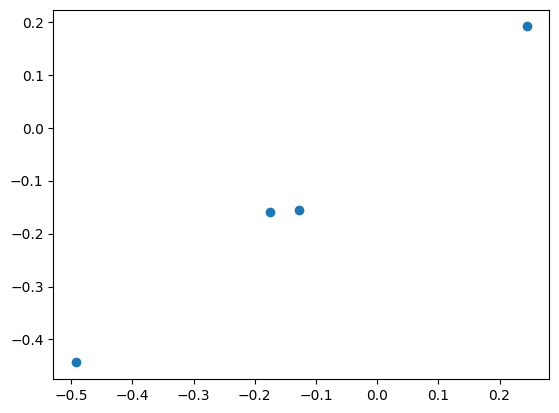

In [100]:
# Ensure the model is in evaluation mode
generator.eval()

# Plotting generator predictions
with torch.no_grad():
    for t in range(len(dataset)):
        real_features_seq = dataset[t][0]
        # adj = adjacency_matrices[t]
        # edge_index = adj.nonzero(as_tuple=False).t().contiguous()

        # Generate predictions
        predicted_features, _ = generator(real_features_seq)
        
        # Convert to NumPy for plotting
        real_features_np = real_features_seq
        predicted_features_np = predicted_features.cpu().numpy()
        print(predicted_features)
        plt.scatter(predicted_features_np[0, :], predicted_features_np[1,:])
        break

        # plt.figure(figsize=(10, 6))
        # plt.scatter(real_features_np[:, 0], real_features_np[:, 1], c='blue', label='Real')
        # plt.scatter(predicted_features_np[:, 0], predicted_features_np[:, 1], c='red', label='Predicted')
        # plt.legend()
        # plt.title(f'Timestep {t}')
        # plt.xlabel('x')
        # plt.ylabel('y')
        # plt.show()

In [103]:
import torch

# Initialize the dataset and dataloader
seq_len = 5
# Hyperparameters
num_epochs = 100
learning_rate_g = 0.001
learning_rate_d = 0.0001
device = torch.device("mps")
# Initialize model, optimizers, and loss function
generator = GRNN(node_feature_dim=4, hidden_dim=32, gru_hidden_dim=32, 
                  output_dim=4, num_nodes=100, seq_len=seq_len).to(device)
discriminator = Discriminator(input_dim=4,hidden_dim=16).to(device)  # Ensure Discriminator is defined

g_optimizer = optim.Adam(generator.parameters(), lr=learning_rate_g)
d_optimizer = optim.Adam(discriminator.parameters(), lr=learning_rate_d)
criterion_discr= nn.BCELoss()
criterion_gen = nn.MSELoss()

# Training loop
generator.train()
discriminator.train()
# Assuming `model`, `optimizer_g`, `optimizer_d`, `data`, and `data_rand` are already defined

num_epochs = 100
for epoch in range(num_epochs):
    
    # Prepare the data for the discriminator
    # data_real and data_fake will be used for the discriminator training
    data_real = dataset  # This should be your real dataset
    data_fake = dataset_rand  # This is the random graph for the generator input
    
    # Get the output from the generator
    fake_data = generator(data_fake)
    
    # Combine real and fake data
    real_labels = torch.ones(data_real.num_graphs, 1)  # Labels for real data
    fake_labels = torch.zeros(data_real.num_graphs, 1)  # Labels for fake data
    
    # Training Discriminator on real data
    optimizer_d.zero_grad()
    output_real = model.discriminator(data_real)
    loss_real = criterion(output_real, real_labels)
    loss_real.backward()
    
    # Training Discriminator on fake data
    output_fake = model.discriminator(fake_data)
    loss_fake = criterion(output_fake, fake_labels)
    loss_fake.backward()
    
    optimizer_d.step()
    
    # Step 2: Update the Generator
    model.train()
    
    # Generate data from the random graph
    fake_data = model.generator(data_fake)
    
    # Train the generator to fool the discriminator
    optimizer_g.zero_grad()
    output = model.discriminator(fake_data)
    labels = torch.ones(data_fake.num_graphs, 1)  # Labels for generator (wants to be classified as real)
    loss_g = criterion(output, labels)
    loss_g.backward()
    
    optimizer_g.step()
    
    print(f'Epoch {epoch+1}/{num_epochs} | D Loss: {loss_real.item() + loss_fake.item()} | G Loss: {loss_g.item()}')


AttributeError: 'tuple' object has no attribute 'edge_index'

: 

In [17]:
import torch
from torch_geometric.nn import ChebConv
class GConvGRU(torch.nn.Module):
    r"""An implementation of the Chebyshev Graph Convolutional Gated Recurrent Unit
    Cell. For details see this paper: `"Structured Sequence Modeling with Graph
    Convolutional Recurrent Networks." <https://arxiv.org/abs/1612.07659>`_
    Args:
        in_channels (int): Number of input features.
        out_channels (int): Number of output features.
        K (int): Chebyshev filter size :math:`K`.
        normalization (str, optional): The normalization scheme for the graph
            Laplacian (default: :obj:`"sym"`):
            1. :obj:`None`: No normalization
            :math:`\mathbf{L} = \mathbf{D} - \mathbf{A}`
            2. :obj:`"sym"`: Symmetric normalization
            :math:`\mathbf{L} = \mathbf{I} - \mathbf{D}^{-1/2} \mathbf{A}
            \mathbf{D}^{-1/2}`
            3. :obj:`"rw"`: Random-walk normalization
            :math:`\mathbf{L} = \mathbf{I} - \mathbf{D}^{-1} \mathbf{A}`
            You need to pass :obj:`lambda_max` to the :meth:`forward` method of
            this operator in case the normalization is non-symmetric.
            :obj:`\lambda_max` should be a :class:`torch.Tensor` of size
            :obj:`[num_graphs]` in a mini-batch scenario and a
            scalar/zero-dimensional tensor when operating on single graphs.
            You can pre-compute :obj:`lambda_max` via the
            :class:`torch_geometric.transforms.LaplacianLambdaMax` transform.
        bias (bool, optional): If set to :obj:`False`, the layer will not learn
            an additive bias. (default: :obj:`True`)
    """
    def __init__(
        self,
        in_channels: int,
        out_channels: int,
        K: int,
        normalization: str = "sym",
        bias: bool = True,
    ):
        super(GConvGRU, self).__init__()
        self.in_channels = in_channels
        self.out_channels = out_channels
        self.K = K
        self.normalization = normalization
        self.bias = bias
        self._create_parameters_and_layers()
    def _create_update_gate_parameters_and_layers(self):
        self.conv_x_z = ChebConv(
            in_channels=self.in_channels,
            out_channels=self.out_channels,
            K=self.K,
            normalization=self.normalization,
            bias=self.bias,
        )
        self.conv_h_z = ChebConv(
            in_channels=self.out_channels,
            out_channels=self.out_channels,
            K=self.K,
            normalization=self.normalization,
            bias=self.bias,
        )
    def _create_reset_gate_parameters_and_layers(self):
        self.conv_x_r = ChebConv(
            in_channels=self.in_channels,
            out_channels=self.out_channels,
            K=self.K,
            normalization=self.normalization,
            bias=self.bias,
        )
        self.conv_h_r = ChebConv(
            in_channels=self.out_channels,
            out_channels=self.out_channels,
            K=self.K,
            normalization=self.normalization,
            bias=self.bias,
        )
    def _create_candidate_state_parameters_and_layers(self):
        self.conv_x_h = ChebConv(
            in_channels=self.in_channels,
            out_channels=self.out_channels,
            K=self.K,
            normalization=self.normalization,
            bias=self.bias,
        )
        self.conv_h_h = ChebConv(
            in_channels=self.out_channels,
            out_channels=self.out_channels,
            K=self.K,
            normalization=self.normalization,
            bias=self.bias,
        )
    def _create_parameters_and_layers(self):
        self._create_update_gate_parameters_and_layers()
        self._create_reset_gate_parameters_and_layers()
        self._create_candidate_state_parameters_and_layers()
    def _set_hidden_state(self, X, H):
        if H is None:
            H = torch.zeros(X.shape[0], self.out_channels).to(X.device)
        return H
    def _calculate_update_gate(self, X, edge_index, edge_weight, H, lambda_max):
        Z = self.conv_x_z(X, edge_index, edge_weight, lambda_max=lambda_max)
        Z = Z + self.conv_h_z(H, edge_index, edge_weight, lambda_max=lambda_max)
        Z = torch.sigmoid(Z)
        return Z
    def _calculate_reset_gate(self, X, edge_index, edge_weight, H, lambda_max):
        R = self.conv_x_r(X, edge_index, edge_weight, lambda_max=lambda_max)
        R = R + self.conv_h_r(H, edge_index, edge_weight, lambda_max=lambda_max)
        R = torch.sigmoid(R)
        return R
    def _calculate_candidate_state(self, X, edge_index, edge_weight, H, R, lambda_max):
        H_tilde = self.conv_x_h(X, edge_index, edge_weight, lambda_max=lambda_max)
        H_tilde = H_tilde + self.conv_h_h(H * R, edge_index, edge_weight, lambda_max=lambda_max)
        H_tilde = torch.tanh(H_tilde)
        return H_tilde
    def _calculate_hidden_state(self, Z, H, H_tilde):
        H = Z * H + (1 - Z) * H_tilde
        return H
    def forward(
        self,
        X: torch.FloatTensor,
        edge_index: torch.LongTensor,
        edge_weight: torch.FloatTensor = None,
        H: torch.FloatTensor = None,
        lambda_max: torch.Tensor = None,
    ) -> torch.FloatTensor:
        """
        Making a forward pass. If edge weights are not present the forward pass
        defaults to an unweighted graph. If the hidden state matrix is not present
        when the forward pass is called it is initialized with zeros.
        Arg types:
            * **X** *(PyTorch Float Tensor)* - Node features.
            * **edge_index** *(PyTorch Long Tensor)* - Graph edge indices.
            * **edge_weight** *(PyTorch Long Tensor, optional)* - Edge weight vector.
            * **H** *(PyTorch Float Tensor, optional)* - Hidden state matrix for all nodes.
            * **lambda_max** *(PyTorch Tensor, optional but mandatory if normalization is not sym)* - Largest eigenvalue of Laplacian.
        Return types:
            * **H** *(PyTorch Float Tensor)* - Hidden state matrix for all nodes.
        """
        H = self._set_hidden_state(X, H)
        Z = self._calculate_update_gate(X, edge_index, edge_weight, H, lambda_max)
        R = self._calculate_reset_gate(X, edge_index, edge_weight, H, lambda_max)
        H_tilde = self._calculate_candidate_state(X, edge_index, edge_weight, H, R, lambda_max)
        H = self._calculate_hidden_state(Z, H, H_tilde)
        return H

In [18]:
class Encoder(nn.Module):
    def __init__(self, node_feature_dim, hidden_dim, recurrent_dim, output_dim):
        super(Encoder, self).__init__()
        self.conv1 = GCNConv(node_feature_dim, hidden_dim)
        self.conv2 = GCNConv(hidden_dim, recurrent_dim)
        self.reccurent = GConvGRU(recurrent_dim,output_dim)
    
    def forward(self,x,edge_index,edge_weight,H=None):
        x = self.conv1(x, edge_index, edge_weight)
        x = torch.relu(x)
        x = self.conv2(x, edge_index, edge_weight)
        x = torch.relu(x)
        h = self.reccurent(x,edge_index,edge_weight,H)
        return h

class Decoder(nn.Module):
    def __init__(self, node_feature_dim, hidden_dim, recurrent_dim, output_dim):
        super(Decoder, self).__init__()
        self.recurrent = GConvGRU(output_dim, recurrent_dim)
        self.conv2 = GCNConv(recurrent_dim, hidden_dim)
        self.conv1 = GCNConv(hidden_dim, node_feature_dim)

    def forward(self, h, edge_index, edge_weight, H=None):
        x = self.recurrent(h, edge_index, edge_weight, H)
        x = torch.relu(x)
        x = self.conv2(x, edge_index, edge_weight)
        x = torch.relu(x)
        x = self.conv1(x, edge_index, edge_weight)
        return x
        
        

In [ ]:
class GraphSeqGenerator(nn.Module):
    def __init__(self, obs_len, pred_len, 
                 node_feature_dim, 
                 encoder_hidden_dim, encoder_recurrent_dim, enconder_output_dim,
                 decoder_hidden_dim, decoder_recurrent_dim, decoder_output_dim,
                 noise_dim,
                 noise_type="guassian"):
        self.obs_len = obs_len
        self.pred_len = pred_len
        self.node_feature_dim = node_feature_dim

        self.encoder_hidden_dim = encoder_hidden_dim
        self.encoder_recurrent_dim = encoder_recurrent_dim
        self.enconder_output_dim = enconder_output_dim

        self.decoder_hidden_dim = decoder_hidden_dim
        self.decoder_recurrent_dim = decoder_recurrent_dim
        self.decoder_output_dim = decoder_output_dim

        self.noise_dim = noise_dim
        self.noise_type = noise_type

        self.enconder = Encoder(
                                node_feature_dim=self.node_feature_dim,
                                hidden_dim=self.encoder_hidden_dim,
                                recurrent_dim=self.encoder_recurrent_dim,
                                output_dim=self.enconder_output_dim
                                )
        
        self.decoder = Decoder(
                                node_feature_dim=self.node_feature_dim,
                                hidden_dim=self.decoder_hidden_dim,
                                recurrent_dim=self.decoder_recurrent_dim,
                                output_dim=self.decoder_output_dim
                                )
        


In [8]:
import torch
import torch.nn as nn
from torch_geometric.nn import GCNConv

def make_mlp(dim_list, activation='relu', batch_norm=True, dropout=0):
    layers = []
    for dim_in, dim_out in zip(dim_list[:-1], dim_list[1:]):
        layers.append(nn.Linear(dim_in, dim_out))
        if batch_norm:
            layers.append(nn.BatchNorm1d(dim_out))
        if activation == 'relu':
            layers.append(nn.ReLU())
        elif activation == 'leakyrelu':
            layers.append(nn.LeakyReLU())
        if dropout > 0:
            layers.append(nn.Dropout(p=dropout))
    return nn.Sequential(*layers)


def get_noise(shape, noise_type):
    if noise_type == 'gaussian':
        return torch.randn(*shape).cuda()
    elif noise_type == 'uniform':
        return torch.rand(*shape).sub_(0.5).mul_(2.0).cuda()
    raise ValueError('Unrecognized noise type "%s"' % noise_type)


class GCNEncoder(nn.Module):
    def __init__(self, in_channels, out_channels, num_layers=2):
        super(GCNEncoder, self).__init__()
        self.convs = nn.ModuleList()
        self.convs.append(GCNConv(in_channels, 2 * out_channels))
        for _ in range(num_layers - 2):
            self.convs.append(GCNConv(2 * out_channels, 2 * out_channels))
        self.convs.append(GCNConv(2 * out_channels, out_channels))
        self.relu = nn.ReLU()

    def forward(self, x, edge_index):
        for conv in self.convs[:-1]:
            x = self.relu(conv(x, edge_index))
        x = self.convs[-1](x, edge_index)
        return x


class GCNDecoder(nn.Module):
    def __init__(self, in_channels, out_channels, seq_len, num_layers=2):
        super(GCNDecoder, self).__init__()
        self.convs = nn.ModuleList()
        self.convs.append(GCNConv(in_channels, 2 * out_channels))
        for _ in range(num_layers - 2):
            self.convs.append(GCNConv(2 * out_channels, 2 * out_channels))
        self.convs.append(GCNConv(2 * out_channels, out_channels))
        self.relu = nn.ReLU()
        self.seq_len = seq_len
        self.out_channels = out_channels

    def forward(self, x, edge_index):
        outputs = []
        for _ in range(self.seq_len):
            for conv in self.convs[:-1]:
                x = self.relu(conv(x, edge_index))
            x = self.convs[-1](x, edge_index)
            outputs.append(x)
        return torch.stack(outputs)


class TrajectoryGenerator(nn.Module):
    def __init__(self, obs_len, pred_len, node_features, hidden_dim, num_layers=2, noise_dim=(0, ), noise_type='gaussian'):
        super(TrajectoryGenerator, self).__init__()
        self.obs_len = obs_len
        self.pred_len = pred_len
        self.hidden_dim = hidden_dim
        self.noise_dim = noise_dim
        self.noise_type = noise_type
        self.encoder = GCNEncoder(node_features, hidden_dim, num_layers)
        self.decoder = GCNDecoder(hidden_dim, node_features, pred_len, num_layers)

    def add_noise(self, x, batch_size):
        if self.noise_dim[0] == 0:
            return x
        noise = get_noise((batch_size, *self.noise_dim), self.noise_type)
        return torch.cat([x, noise], dim=-1)

    def forward(self, data):
        batch_size = data.num_nodes
        edge_index = data.edge_index
        x = data.x

        encoded = self.encoder(x, edge_index)
        encoded = self.add_noise(encoded, batch_size)
        decoded = self.decoder(encoded, edge_index)
        return decoded

class TrajectoryDiscriminator(nn.Module):
    def __init__(
        self, obs_len, pred_len, embedding_dim=64, h_dim=64, mlp_dim=1024,
        num_layers=1, activation='relu', batch_norm=True, dropout=0.0,
        d_type='local'
    ):
        super(TrajectoryDiscriminator, self).__init__()

        self.obs_len = obs_len
        self.pred_len = pred_len
        self.seq_len = obs_len + pred_len
        self.mlp_dim = mlp_dim
        self.h_dim = h_dim
        self.d_type = d_type

        self.encoder = Encoder(
            embedding_dim=embedding_dim,
            h_dim=h_dim,
            mlp_dim=mlp_dim,
            num_layers=num_layers,
            dropout=dropout
        )

        real_classifier_dims = [h_dim, mlp_dim, 1]
        self.real_classifier = make_mlp(
            real_classifier_dims,
            activation=activation,
            batch_norm=batch_norm,
            dropout=dropout
        )
        if d_type == 'global':
            mlp_pool_dims = [h_dim + embedding_dim, mlp_dim, h_dim]
            self.pool_net = PoolHiddenNet(
                embedding_dim=embedding_dim,
                h_dim=h_dim,
                mlp_dim=mlp_pool_dims,
                bottleneck_dim=h_dim,
                activation=activation,
                batch_norm=batch_norm
            )

    def forward(self, traj, traj_rel, seq_start_end=None):
        """
        Inputs:
        - traj: Tensor of shape (obs_len + pred_len, batch, 2)
        - traj_rel: Tensor of shape (obs_len + pred_len, batch, 2)
        - seq_start_end: A list of tuples which delimit sequences within batch
        Output:
        - scores: Tensor of shape (batch,) with real/fake scores
        """
        final_h = self.encoder(traj_rel)
        # Note: In case of 'global' option we are using start_pos as opposed to
        # end_pos. The intution being that hidden state has the whole
        # trajectory and relative postion at the start when combined with
        # trajectory information should help in discriminative behavior.
        if self.d_type == 'local':
            classifier_input = final_h.squeeze()
        else:
            classifier_input = self.pool_net(
                final_h.squeeze(), seq_start_end, traj[0]
            )
        scores = self.real_classifier(classifier_input)
        return scores


# Example usage
obs_len = 8
pred_len = 12
node_features = 2  # Assuming x and y coordinates
hidden_dim = 64
num_layers = 2

model = TrajectoryGenerator(obs_len, pred_len, node_features, hidden_dim, num_layers)
data = dataset
output = model(data)


AttributeError: 'list' object has no attribute 'num_nodes'

In [11]:
dataset

[Ellipsis]